# AMIA - MHEDAS - Challenge

#### Marc Albesa, Maria Fité, Jaume Juan

## Import libraries

In [1]:
from pathlib import Path
import pandas as pd
from IPython.display import display
import os
import plotly.graph_objects as go
from tqdm.notebook import tqdm
from PIL import Image
import numpy as np
import seaborn as sns
import matplotlib
import matplotlib.pyplot as plt
import plotly.express as px

## Import data

In [2]:
# Input data (read-only)
BASE_DIR  = Path("/data/mhedas/common/challenge_dataset")
TRAIN_DIR = BASE_DIR / "train" / "train"
TEST_DIR  = BASE_DIR / "test" / "test"

# Output / working dir (where new files go)
OUTPUT_DIR = Path("/data/mhedas/common/jjuan/AMIA")
OUTPUT_DIR.mkdir(parents=True, exist_ok=True)

# Load CSVs
train_df   = pd.read_csv(BASE_DIR / "train.csv")
test_df    = pd.read_csv(BASE_DIR / "test.csv")
img_size   = pd.read_csv(BASE_DIR / "img_size.csv")
sample_sub = pd.read_csv(BASE_DIR / "sample_submission.csv")

## Exploratory Data Analysis

### Tabular Data

#### Train data

In [3]:
display(train_df.head(3))
print(f"Metadata train_df shape: {train_df.shape}")
print(f"Number of train_df unique images: {train_df['image_id'].nunique()}")
print(f"Number of training files: {len(list(TRAIN_DIR.glob("*")))}")

,image_id,class_name,class_id,rad_id,x_min,y_min,x_max,y_max
0,bM8C97htulC9fHKIDurJHquCXr1KZuug,No finding,14,R5,NaN,NaN,NaN,NaN
1,0FDQVdLgDKI1sRnPL94LzVh9EvXDVM9m,Aortic enlargement,0,R10,1148.0,503.0,1466.0,823.0
2,Dwk2TnGJFaMhyi3OfCrhdZG9ppGglC5w,Consolidation,4,R8,264.0,732.0,550.0,1119.0


Metadata train_df shape: (45925, 8)
Number of train_df unique images: 8573
Number of training files: 8573


#### Test data

In [4]:
display(test_df.head(3))
print(f"test_df shape: {test_df.shape}")
print(f"Number of test_df unique images: {test_df['image_id'].nunique()}")
print(f"Number of testing files: {len(list(TEST_DIR.glob("*")))}")

,image_id
0,3r9OdPSdvQ58qI3VUFUeSKyCvxBpFc0c
1,LO2jAm8E96Ih87wJVoqiOXHixrwPMeOm
2,PN7S4HbhNp4fht9TTc6DXGOKGkeRTR7W


test_df shape: (21989, 1)
Number of test_df unique images: 6427
Number of testing files: 6427


#### Image size dataframe

In [5]:
display(img_size.head(3))
print(f"Metadata img_size shape: {img_size.shape}")
print(f"Number of img_size unique images: {img_size['image_id'].nunique()}")

,image_id,dim0,dim1
0,j8ucb4pF6s210AWzYbWtWDjkHDfEIvqh,3000,3000
1,QX1b3KBwsnmxGJzmdUwwH0IeQtNlvYAU,3072,3072
2,kXObj3UtUTmZDgpBy3UdxAi2hef5ODEx,2836,2336


Metadata img_size shape: (15000, 3)
Number of img_size unique images: 15000


#### Sample submission dataframe

In [6]:
display(sample_sub.head(3))
print(f"sample_sub shape: {sample_sub.shape}")
print(f"Number of sample_sub unique images: {sample_sub['image_id'].nunique()}")

,image_id,PredictionString
0,3r9OdPSdvQ58qI3VUFUeSKyCvxBpFc0c,14 1.0 0 0 1 1
1,LO2jAm8E96Ih87wJVoqiOXHixrwPMeOm,14 1.0 0 0 1 1
2,PN7S4HbhNp4fht9TTc6DXGOKGkeRTR7W,14 1.0 0 0 1 1


sample_sub shape: (6427, 2)
Number of sample_sub unique images: 6427


### Image Data

In [7]:
# Count annotations per image
counts = train_df.image_id.value_counts()

# Frequency of annotation counts
full_counts = (
    counts.value_counts()
    .reindex(range(1, counts.max() + 1), fill_value=0)
)

fig = px.bar(
    x=full_counts.index,
    y=full_counts.values,
    log_y=True,
    opacity=0.5,
    labels={
        "x": "Number of annotations per image",
        "y": "Frequency of unique images"
    },
    title="<b>Number of Annotations per Image<b>"
          "<i><sub>(Log Scale for Y-Axis)</sub></i>",
)

# Force ticks: 3, 5, 10, 15, 20, ...
tick_vals = [3] + list(range(5, counts.max() + 1, 5))

fig.update_layout(
    showlegend=False,
    xaxis=dict(
        tickmode="array",
        tickvals=tick_vals
    )
)

fig.show()

In [8]:

# Number of unique abnormalities per patient/image
counts = (
    train_df.groupby("image_id")["class_name"]
    .unique()
    .apply(len)
)

# Frequency distribution
full_counts = (
    counts.value_counts()
    .reindex(range(1, counts.max() + 1), fill_value=0)
)

fig = px.bar(
    x=full_counts.index,
    y=full_counts.values,
    log_y=True,
    opacity=0.5,
    labels={
        "x": "Number of unique abnormalities",
        "y": "Frequancy of unique patients"
    },
    title="<b>Number of annotations per patient<b>"
          "<i><sub>(Log Scale for Y-Axis)</sub></i>",
)

# Force ticks: 1, 5, 10, 15, ...
tick_vals = list(range(0, counts.max() + 1, 1))

fig.update_layout(
    showlegend=False,
    xaxis=dict(
        tickmode="array",
        tickvals=tick_vals,
        title="Number of unique abnormalities"
    ),
    yaxis=dict(
        title="Count of unique patients"
    )
)

fig.show()

In [9]:
LABEL_COLORS = [
    "#E63946", "#F4A261", "#E9C46A", "#2A9D8F", "#264653",
    "#8ECAE6", "#219EBC", "#023047", "#FB8500", "#FFB703",
    "#A663CC", "#6A0572", "#B5179E", "#3A0CA3", "#4361EE",
]

counts = (
    train_df.class_name.value_counts()
    .reset_index()
)
counts.columns = ["class_name", "count"]
# Already sorted descending by value_counts(), but make it explicit:
counts = counts.sort_values("count", ascending=False)

fig = px.bar(
    counts,
    x="class_name",
    y="count",
    color="class_name",
    opacity=0.85,
    color_discrete_sequence=LABEL_COLORS,
    log_y=True,
    title="<b>Annotations Per Class</b>",
)
fig.update_layout(
    legend_title=None,
    xaxis_title="",
    yaxis_title="Annotations frequency",
    xaxis={"categoryorder": "total descending"},  # ensures bar order on x-axis
)
fig.show()

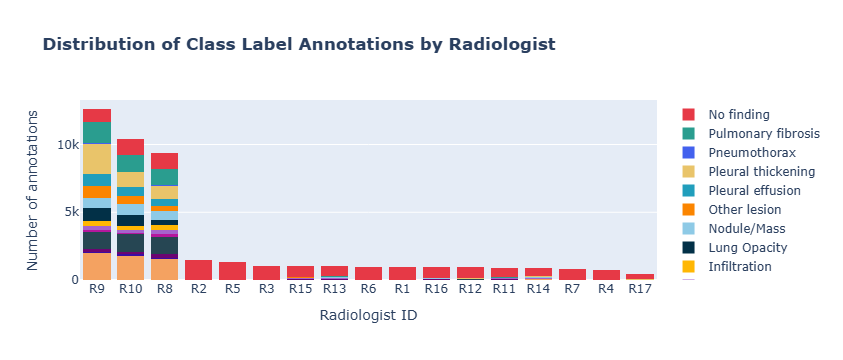

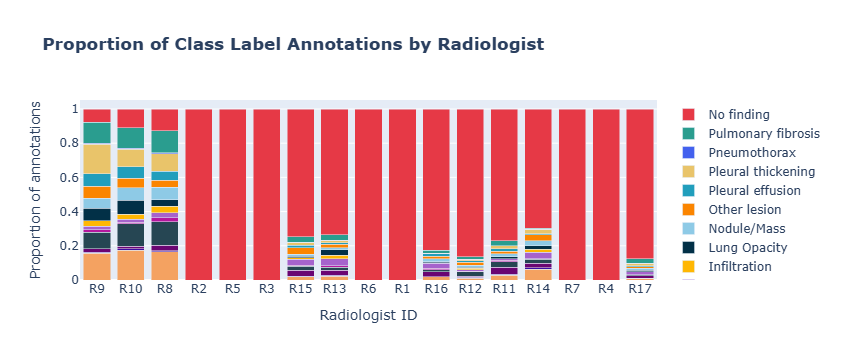

In [10]:
# Build the same class → color mapping used in the "Annotations Per Class" plot
class_order = train_df["class_name"].value_counts().index.tolist()  # descending by count
name_to_color = {name: LABEL_COLORS[i] for i, name in enumerate(class_order)}

# Map class_id → name and class_id → color using that consistent palette
id_to_name = (
    train_df[["class_id", "class_name"]]
    .drop_duplicates()
    .set_index("class_id")["class_name"]
    .to_dict()
)
id_to_color = {cid: name_to_color[name] for cid, name in id_to_name.items()}


def plot_rad_distribution(df, title, normalize=False):
    fig = go.Figure()

    if normalize:
        rad_totals = df["rad_id"].value_counts()
        for i in sorted(id_to_name):
            sub = df[df["class_id"] == i]
            counts = sub["rad_id"].value_counts()
            normalized = (counts / rad_totals).reindex(rad_totals.index).fillna(0)
            fig.add_trace(go.Bar(
                x=normalized.index,
                y=normalized.values,
                marker_color=id_to_color[i],
                name=f"{id_to_name[i]}",
            ))
        yaxis_title = "Proportion of annotations"
    else:
        for i in sorted(id_to_name):
            fig.add_trace(go.Histogram(
                x=df[df["class_id"] == i]["rad_id"],
                marker_color=id_to_color[i],
                name=f"{id_to_name[i]}",
            ))
        yaxis_title = "Number of annotations"

    fig.update_xaxes(categoryorder="total descending")
    fig.update_layout(
        title=title,
        barmode="stack",
        xaxis_title="Radiologist ID",
        yaxis_title=yaxis_title,
        legend_title=None,
    )
    fig.show()


# Plot 1 — raw counts
plot_rad_distribution(
    train_df,
    title="<b>Distribution of Class Label Annotations by Radiologist</b>",
)

# Plot 3 — normalized
plot_rad_distribution(
    train_df,
    title="<b>Proportion of Class Label Annotations by Radiologist</b>",
    normalize=True,
)

In [11]:
def create_fractional_bbox_coordinates(row):
    """ Function to return bbox coordiantes as fractions from DF row """
    frac_x_min = row["x_min"]/row["img_width"]
    frac_x_max = row["x_max"]/row["img_width"]
    frac_y_min = row["y_min"]/row["img_height"]
    frac_y_max = row["y_max"]/row["img_height"]
    return frac_x_min, frac_x_max, frac_y_min, frac_y_max

Dims range: H 927–3408, W 823–3320
Max frac_x_max: 1.0000  (should be ≤ 1.0)
Max frac_y_max: 1.0000  (should be ≤ 1.0)
Average dims: 2797 x 2456


100%|██████████| 45925/45925 [04:32<00:00, 168.24it/s]


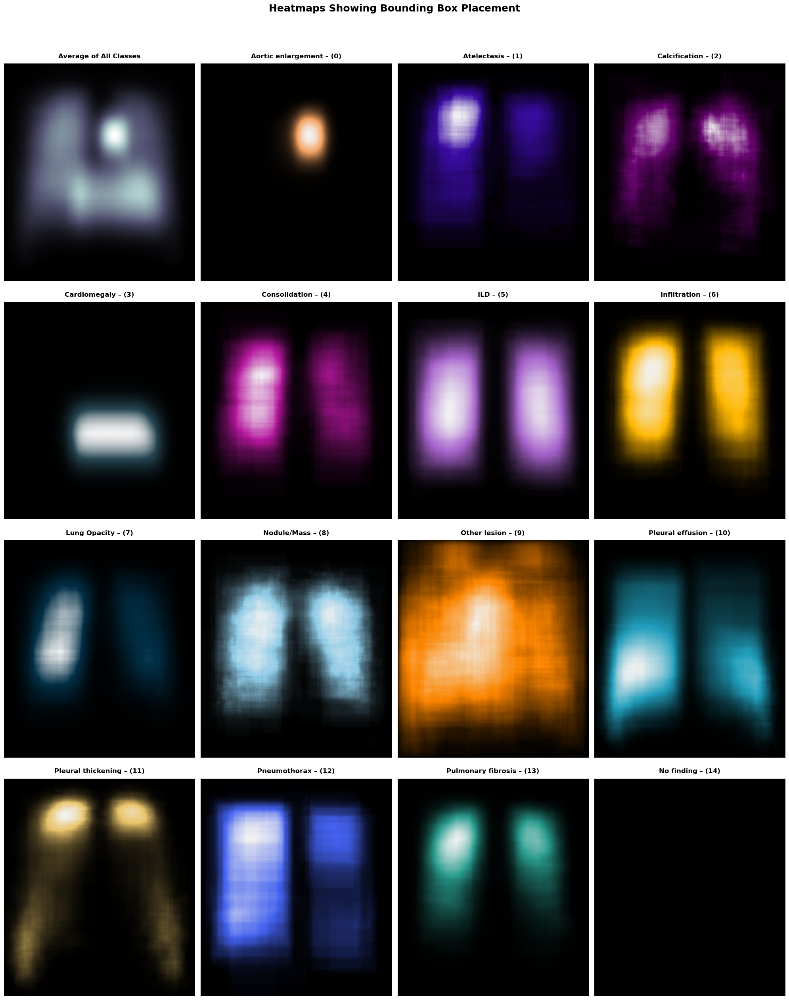

In [12]:
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
from tqdm import tqdm

# ──────────────────────────────────────────────────────────────────
# 1. Prepare bbox_df with correct (original DICOM) dimensions
# ──────────────────────────────────────────────────────────────────

# Keep ALL classes, including "No finding" (class_id == 14)
bbox_df = train_df.copy().reset_index(drop=True)

# For "No finding" rows, bbox columns are NaN — fill with full-image coords
# so they contribute a uniform background to the heatmap
nf_mask = bbox_df["class_id"] == 14
bbox_df.loc[nf_mask, ["x_min", "y_min"]] = 0
# x_max / y_max will be set to image dims after the merge below

# Merge original DICOM dimensions
bbox_df = bbox_df.merge(
    img_size.rename(columns={"dim0": "img_height", "dim1": "img_width"}),
    on="image_id",
    how="left",
)

# Now fill the "No finding" x_max / y_max with each image's full dimensions
bbox_df.loc[nf_mask, "x_max"] = bbox_df.loc[nf_mask, "img_width"]
bbox_df.loc[nf_mask, "y_max"] = bbox_df.loc[nf_mask, "img_height"]

missing = bbox_df[["img_height", "img_width"]].isna().sum().sum()
assert missing == 0, f"Missing dimensions for {missing} rows!"
print(f"Dims range: H {bbox_df.img_height.min()}–{bbox_df.img_height.max()}, "
      f"W {bbox_df.img_width.min()}–{bbox_df.img_width.max()}")

# Compute fractional bbox coordinates against original DICOM dims
bbox_df["frac_x_min"], bbox_df["frac_x_max"], bbox_df["frac_y_min"], bbox_df["frac_y_max"] = \
    zip(*bbox_df.apply(create_fractional_bbox_coordinates, axis=1))

print(f"Max frac_x_max: {bbox_df.frac_x_max.max():.4f}  (should be ≤ 1.0)")
print(f"Max frac_y_max: {bbox_df.frac_y_max.max():.4f}  (should be ≤ 1.0)")

# Average dims
unique_imgs = bbox_df.drop_duplicates("image_id")
ave_src_img_height = int(unique_imgs["img_height"].mean())
ave_src_img_width  = int(unique_imgs["img_width"].mean())
print(f"Average dims: {ave_src_img_height} x {ave_src_img_width}")


# ──────────────────────────────────────────────────────────────────
# 2. Build the heatmap (15 channels: all classes)
# ──────────────────────────────────────────────────────────────────

HEATMAP_SIZE = (ave_src_img_height, ave_src_img_width, 15)
heatmap = np.zeros(HEATMAP_SIZE, dtype=np.int32)

bbox_np = bbox_df[["class_id", "frac_x_min", "frac_x_max", "frac_y_min", "frac_y_max"]].to_numpy()
bbox_np[:, 1:3] *= ave_src_img_width
bbox_np[:, 3:5] *= ave_src_img_height
bbox_np = np.floor(bbox_np).astype(np.int32)

for row in tqdm(bbox_np, total=bbox_np.shape[0]):
    heatmap[row[3]:row[4] + 1, row[1]:row[2] + 1, row[0]] += 1


# ──────────────────────────────────────────────────────────────────
# 3. Per-class colormaps (consistent with the rest of the notebook)
# ──────────────────────────────────────────────────────────────────

LABEL_COLORS = [
    "#E63946", "#F4A261", "#E9C46A", "#2A9D8F", "#264653",
    "#8ECAE6", "#219EBC", "#023047", "#FB8500", "#FFB703",
    "#A663CC", "#6A0572", "#B5179E", "#3A0CA3", "#4361EE",
]

CLASS_ORDER = train_df["class_name"].value_counts().index.tolist()
CLASS_COLOR_MAP = {name: LABEL_COLORS[i] for i, name in enumerate(CLASS_ORDER)}

id_to_name = (
    train_df[["class_id", "class_name"]]
    .drop_duplicates()
    .set_index("class_id")["class_name"]
    .to_dict()
)

def make_cmap(hex_color, name):
    rgb = matplotlib.colors.to_rgb(hex_color)
    return matplotlib.colors.LinearSegmentedColormap.from_list(
        name=name,
        colors=[(0.0, 0.0, 0.0), rgb, (0.95, 0.95, 0.95)],
    )

class_cmaps = {
    cid: make_cmap(CLASS_COLOR_MAP[id_to_name[cid]], f"custom_{cid}")
    for cid in range(15)
}


# ──────────────────────────────────────────────────────────────────
# 4. Plot — 4×4 grid (16 cells: 1 average + 15 classes)
# ──────────────────────────────────────────────────────────────────

fig, axes = plt.subplots(4, 4, figsize=(20, 26))
plt.suptitle("Heatmaps Showing Bounding Box Placement",
             fontweight="bold", fontsize=18, y=0.995)
axes = axes.flatten()

# First subplot: average across all 15 classes
axes[0].imshow(heatmap.mean(axis=-1), cmap="bone")
axes[0].set_title("Average of All Classes", fontweight="bold", pad=10)
axes[0].axis(False)

# Remaining 15: one per class
for i in range(15):
    axes[i + 1].imshow(heatmap[:, :, i], cmap=class_cmaps[i])
    axes[i + 1].set_title(f"{id_to_name[i]} – ({i})", fontweight="bold", pad=10)
    axes[i + 1].axis(False)

fig.tight_layout(rect=[0, 0.015, 1, 0.97])
plt.show()

,image_id,class_name,class_id,rad_id,x_min,y_min,x_max,y_max,img_height,img_width,frac_x_min,frac_x_max,frac_y_min,frac_y_max,frac_bbox_area
1,0FDQVdLgDKI1sRnPL94LzVh9EvXDVM9m,Aortic enlargement,0,R10,1148.0,503.0,1466.0,823.0,2154,2402,0.477935,0.610325,0.233519,0.382080,0.019668
2,Dwk2TnGJFaMhyi3OfCrhdZG9ppGglC5w,Consolidation,4,R8,264.0,732.0,550.0,1119.0,2464,2072,0.127413,0.265444,0.297078,0.454140,0.021679
5,SfZftHo1WIammJ8tb4rBMSzDaTtWYNsM,Nodule/Mass,8,R8,1624.0,1115.0,1741.0,1242.0,2817,2664,0.609610,0.653529,0.395811,0.440895,0.001980
7,qvPw02EvPFN4H42FIkPlsUjEhQZkgqJe,Cardiomegaly,3,R9,786.0,1620.0,1618.0,2132.0,2500,2048,0.383789,0.790039,0.648000,0.852800,0.083200
8,w6fPyFCOHnKXcXhD5m1XxEbfTa5nWDwx,Nodule/Mass,8,R8,1594.0,1222.0,1743.0,1381.0,2880,2304,0.691840,0.756510,0.424306,0.479514,0.003570


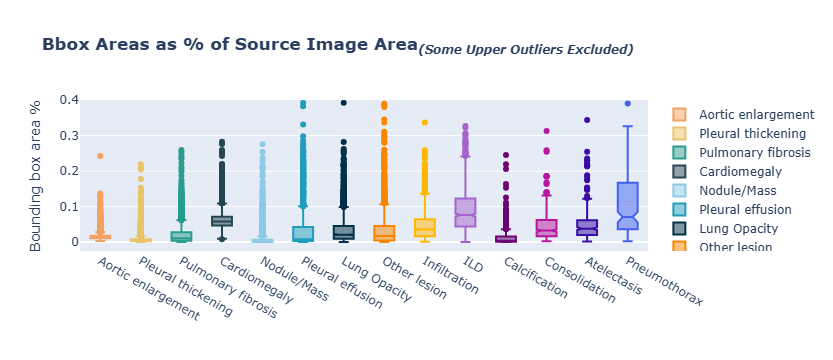

In [13]:
import plotly.express as px

# ──────────────────────────────────────────────────────────────────
# 1. Compute bbox area as fraction of source image area
# ──────────────────────────────────────────────────────────────────

# Exclude "No finding" (class_id == 14) since it has no real bboxes
bbox_area_df = bbox_df[bbox_df["class_id"] != 14].copy()

bbox_area_df["frac_bbox_area"] = (
    (bbox_area_df["frac_x_max"] - bbox_area_df["frac_x_min"])
    * (bbox_area_df["frac_y_max"] - bbox_area_df["frac_y_min"])
)

# Use class_name (already in the dataframe) — no need for int_2_str
display(bbox_area_df.head())


# ──────────────────────────────────────────────────────────────────
# 2. Class order: by overall frequency (matches other plots)
# ──────────────────────────────────────────────────────────────────

# Same descending-by-count order as your "Annotations Per Class" plot,
# but with "No finding" removed so colors line up with the boxes
class_order_no_nf = [c for c in CLASS_ORDER if c != "No finding"]


# ──────────────────────────────────────────────────────────────────
# 3. Plot
# ──────────────────────────────────────────────────────────────────

fig = px.box(
    bbox_area_df,
    x="class_name",
    y="frac_bbox_area",
    color="class_name",
    color_discrete_map=CLASS_COLOR_MAP,   # consistent colors across notebook
    category_orders={"class_name": class_order_no_nf},
    notched=True,
    labels={"class_name": "Class Name", "frac_bbox_area": "BBox Area (%)"},
    title="<b>Bbox Areas as % of Source Image Area<b>"
          "<i><sub>(Some Upper Outliers Excluded)</sub></i>",
)

fig.update_layout(
    showlegend=True,
    yaxis_range=[-0.025, 0.4],
    legend_title_text=None,
    xaxis_title="",
    yaxis_title="Bounding box area %",
)

fig.show()

In [14]:
import plotly.express as px

# ──────────────────────────────────────────────────────────────────
# 1. Compute aspect ratio (width / height) — exclude "No finding"
# ──────────────────────────────────────────────────────────────────

bbox_ar_df = bbox_df[bbox_df["class_id"] != 14].copy()
bbox_ar_df["aspect_ratio"] = (
    (bbox_ar_df["x_max"] - bbox_ar_df["x_min"])
    / (bbox_ar_df["y_max"] - bbox_ar_df["y_min"])
)

# Mean aspect ratio per class (select only the column we need)
mean_ar = (
    bbox_ar_df.groupby("class_name")["aspect_ratio"]
    .mean()
    .reset_index()
)

display(mean_ar)


# ──────────────────────────────────────────────────────────────────
# 2. Order by frequency (consistent with the rest of the notebook)
# ──────────────────────────────────────────────────────────────────

class_order_no_nf = [c for c in CLASS_ORDER if c != "No finding"]


# ──────────────────────────────────────────────────────────────────
# 3. Plot
# ──────────────────────────────────────────────────────────────────

fig = px.bar(
    mean_ar,
    x="class_name",
    y="aspect_ratio",
    color="class_name",
    opacity=0.85,
    color_discrete_map=CLASS_COLOR_MAP,
    category_orders={"class_name": class_order_no_nf},
    labels={"class_name": "Class Name", "aspect_ratio": "Aspect Ratio (W/H)"},
    title="<b>Aspect Ratios for Bounding Boxes by Class</b>",
)

fig.update_layout(
    yaxis_title="Aspect Ratio (W/H)",
    xaxis_title=None,
    legend_title_text=None,
)

# Reference line at 1.0 (square)
fig.add_hline(
    y=1, line_width=2, line_dash="dot",
    annotation_font_size=10,
    annotation_text="<b>SQUARE ASPECT RATIO</b>",
    annotation_position="top left",
    annotation_font_color="black",
)

fig.show()

,class_name,aspect_ratio
0,Aortic enlargement,0.918816
1,Atelectasis,1.053822
2,Calcification,0.931681
3,Cardiomegaly,2.892323
4,Consolidation,0.952709
5,ILD,0.629709
6,Infiltration,0.892594
7,Lung Opacity,1.023528
8,Nodule/Mass,0.992416
9,Other lesion,1.033723


In [15]:
def draw_bboxes(img, tl, br, rgb, label="", label_location="tl", opacity=0.1, line_thickness=0):
    """ TBD 
    
    Args:
        TBD
        
    Returns:
        TBD 
    """
    rect = np.uint8(np.ones((br[1]-tl[1], br[0]-tl[0], 3))*rgb)
    sub_combo = cv2.addWeighted(img[tl[1]:br[1],tl[0]:br[0],:], 1-opacity, rect, opacity, 1.0)    
    img[tl[1]:br[1],tl[0]:br[0],:] = sub_combo

    if line_thickness>0:
        img = cv2.rectangle(img, tuple(tl), tuple(br), rgb, line_thickness)
        
    if label:
        # DEFAULTS
        FONT = cv2.FONT_HERSHEY_SIMPLEX
        FONT_SCALE = 1
        FONT_THICKNESS = 2
        FONT_LINE_TYPE = cv2.LINE_AA
        
        if type(label)==str:
            LABEL = label.upper().replace(" ", "_")
        else:
            LABEL = f"CLASS_{label:02}"
        
        text_width, text_height = cv2.getTextSize(LABEL, FONT, FONT_SCALE, FONT_THICKNESS)[0]
        
        label_origin = {"tl":tl, "br":br, "tr":(br[0],tl[1]), "bl":(tl[0],br[1])}[label_location]
        label_offset = {
            "tl":np.array([0, -10]), "br":np.array([-text_width, text_height+10]), 
            "tr":np.array([-text_width, -10]), "bl":np.array([0, text_height+10])
        }[label_location]
        img = cv2.putText(img, LABEL, tuple(label_origin+label_offset), 
                          FONT, FONT_SCALE, rgb, FONT_THICKNESS, FONT_LINE_TYPE)
    
    return img

In [16]:
import os
import gc
import cv2
import numpy as np
import matplotlib.pyplot as plt


class TrainData():
    def __init__(self, df, train_dir, class_color_map=None, id_to_name=None):
        """
        Args:
            df: DataFrame with columns
                [image_id, class_name, class_id, rad_id, x_min, y_min, x_max, y_max]
            train_dir: directory containing PNG images
            class_color_map: dict mapping class_name → hex color
                             (e.g. CLASS_COLOR_MAP from your notebook)
            id_to_name: dict mapping class_id → class_name
        """
        self.df = df
        self.train_dir = train_dir

        # Color palette: convert hex → BGR-style RGB tuples (0–255) for cv2
        if class_color_map is not None and id_to_name is not None:
            self.pal = {
                cid: tuple(int(c * 255) for c in
                           plt.matplotlib.colors.to_rgb(class_color_map[id_to_name[cid]]))
                for cid in range(15)
            }
        else:
            # Fallback: 15 random-ish colors
            import seaborn as sns
            self.pal = {
                i: tuple(int(c * 255) for c in color)
                for i, color in enumerate(sns.color_palette("Spectral", 15))
            }

        self.id_to_name = id_to_name or {}

        self.img_annotations = self.get_annotations(get_all=True)

    def get_annotations(self, get_all=False, image_ids=None, class_ids=None,
                        rad_ids=None, index=None):
        if not get_all and all(x is None for x in (image_ids, class_ids, rad_ids, index)):
            raise ValueError(
                "Expected one of the following arguments to be passed: "
                "`get_all`, `image_ids`, `class_ids`, `rad_ids`, or `index`"
            )

        tmp_df = self.df.copy()

        if not get_all:
            if image_ids is not None:
                tmp_df = tmp_df[tmp_df.image_id.isin(image_ids)]
            if class_ids is not None:
                tmp_df = tmp_df[tmp_df.class_id.isin(class_ids)]
            if rad_ids is not None:
                tmp_df = tmp_df[tmp_df.rad_id.isin(rad_ids)]
            if index is not None:
                tmp_df = tmp_df.iloc[[index]] if isinstance(index, int) else tmp_df.iloc[index]

        annotations = {image_id: [] for image_id in tmp_df.image_id.to_list()}

        # Column order: image_id, class_name, class_id, rad_id, x_min, y_min, x_max, y_max
        cols = ["image_id", "class_name", "class_id", "rad_id",
                "x_min", "y_min", "x_max", "y_max"]
        for row in tmp_df[cols].to_numpy():
            image_id, class_name, class_id, rad_id = row[0], row[1], int(row[2]), row[3]
            bbox = row[4:]

            ann = dict(
                img_path=os.path.join(self.train_dir, image_id + ".png"),
                image_id=image_id,
                class_id=class_id,
                class_name=class_name,
                rad_id=rad_id,
            )

            # No-finding rows have NaN bbox values — leave as-is, don't try to cast
            if class_id == 14:
                ann["bbox"] = bbox
            else:
                ann["bbox"] = bbox.astype(np.int32)

            annotations[image_id].append(ann)

        return annotations

    def get_annotated_image(self, image_id, annots=None, plot=False,
                            plot_size=(18, 25), plot_title=""):
        if annots is None:
            annots = self.img_annotations

        image_annots = annots[image_id] if isinstance(annots, dict) else annots

        # Read PNG instead of DICOM
        img = cv2.imread(image_annots[0]["img_path"])
        if img is None:
            raise FileNotFoundError(f"Could not read {image_annots[0]['img_path']}")
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

        for ann in image_annots:
            if ann["class_id"] != 14:
                img = draw_bboxes(
                    img,
                    ann["bbox"][:2], ann["bbox"][2:4],
                    rgb=self.pal[ann["class_id"]],
                    label=ann["class_name"],   # use the name from the row directly
                    opacity=0.08, line_thickness=4,
                )

        if plot:
            plot_image(img, title=plot_title, figsize=plot_size)

        return img

    def _plot_grid(self, annotations, n, height_multiplier, verbose):
        """Shared plotting logic for plot_image_ids / plot_classes / plot_radiologists."""
        n = min(n, len(annotations))
        if n == 0:
            print("No annotations found for those filters.")
            return

        ncols = 2
        nrows = (n + ncols - 1) // ncols  # ceiling division — handles odd n

        plt.figure(figsize=(20, height_multiplier * nrows))
        for i, (image_id, annots) in enumerate(annotations.items()):
            if i >= n:
                break
            if verbose:
                print(".", end="")
            plt.subplot(nrows, ncols, i + 1)
            plt.imshow(self.get_annotated_image(image_id, annots))
            plt.axis(False)
            plt.title(f"Image ID – {image_id}")
        plt.tight_layout(rect=[0, 0.03, 1, 0.97])
        plt.show()

    def plot_image_ids(self, image_id_list, height_multiplier=6, verbose=True):
        annotations = self.get_annotations(image_ids=image_id_list)
        self._plot_grid(annotations, n=len(image_id_list),
                        height_multiplier=height_multiplier, verbose=verbose)

    def plot_classes(self, class_list, n=4, height_multiplier=6, verbose=True):
        annotations = self.get_annotations(class_ids=class_list)
        self._plot_grid(annotations, n=n,
                        height_multiplier=height_multiplier, verbose=verbose)

    def plot_radiologists(self, rad_id_list, n=4, height_multiplier=6, verbose=True):
        annotations = self.get_annotations(rad_ids=rad_id_list)
        self._plot_grid(annotations, n=n,
                        height_multiplier=height_multiplier, verbose=verbose)


# ──────────────────────────────────────────────────────────────────
# Usage
# ──────────────────────────────────────────────────────────────────

train_data = TrainData(
    train_df,
    TRAIN_DIR,
    class_color_map=CLASS_COLOR_MAP,
    id_to_name=id_to_name,
)


....

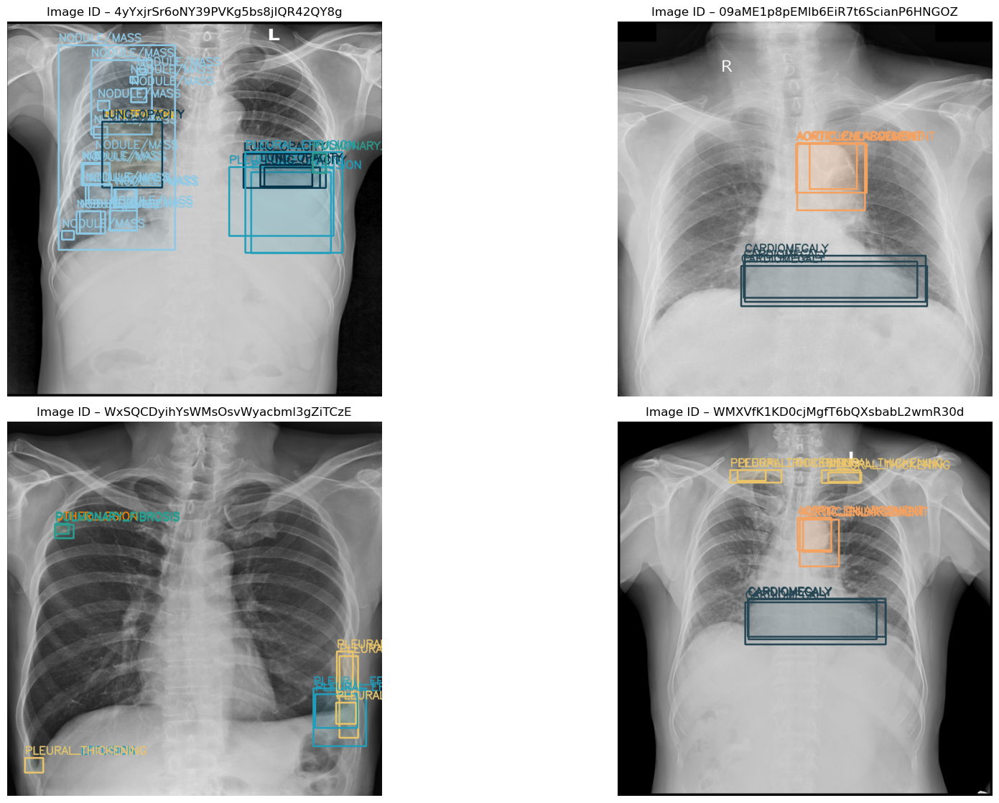

In [17]:
PNG_SIZE = 1024  # adjust if your PNGs aren't 1024x1024

# Merge in original DICOM dimensions
train_df_scaled = train_df.merge(
    img_size.rename(columns={"dim0": "orig_h", "dim1": "orig_w"}),
    on="image_id", how="left",
)

# Per-row scale factors (DICOM coord space → PNG coord space)
sx = PNG_SIZE / train_df_scaled["orig_w"]
sy = PNG_SIZE / train_df_scaled["orig_h"]

# Apply only to rows with real bboxes (skip class_id == 14, which has NaN bboxes)
has_bbox = train_df_scaled["class_id"] != 14
for col, scale in [("x_min", sx), ("x_max", sx),
                   ("y_min", sy), ("y_max", sy)]:
    train_df_scaled.loc[has_bbox, col] = (
        train_df_scaled.loc[has_bbox, col] * scale[has_bbox]
    ).round()

train_df_scaled = train_df_scaled.drop(columns=["orig_h", "orig_w"])

# Sanity check
#print(f"Max x_max: {train_df_scaled[has_bbox]['x_max'].max():.1f}  (should be ≤ {PNG_SIZE})")
#print(f"Max y_max: {train_df_scaled[has_bbox]['y_max'].max():.1f}  (should be ≤ {PNG_SIZE})")

# Build TrainData with the rescaled coordinates
train_data = TrainData(
    train_df_scaled, TRAIN_DIR,
    class_color_map=CLASS_COLOR_MAP,
    id_to_name=id_to_name,
)

# Plot
IMAGE_ID_LIST = train_df[train_df.class_id != 14].image_id.unique()[25:29].tolist()
train_data.plot_image_ids(IMAGE_ID_LIST)

Above we can see images with multi-class annotations

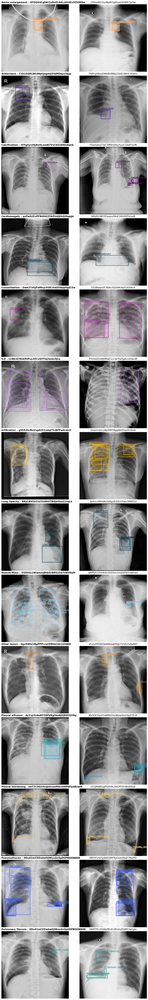

In [18]:
import matplotlib.pyplot as plt

n_classes = 14
examples_per_class = 2

fig, axes = plt.subplots(
    n_classes, examples_per_class,
    figsize=(12, 5 * n_classes),
)

for class_id in range(n_classes):
    # Get up to N images for this class
    annots = train_data.get_annotations(class_ids=[class_id])
    image_ids = list(annots.keys())[:examples_per_class]

    for j, image_id in enumerate(image_ids):
        ax = axes[class_id, j]
        ax.imshow(train_data.get_annotated_image(image_id, annots))
        ax.axis(False)
        if j == 0:
            ax.set_title(f"{id_to_name[class_id]} – {image_id}",
                         fontweight="bold", loc="left")
        else:
            ax.set_title(image_id)

    # If fewer than N examples found, hide the empty axes
    for j in range(len(image_ids), examples_per_class):
        axes[class_id, j].axis(False)

plt.tight_layout(pad=0.5)
plt.show()

For each class, images with a single class annotation.